In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from statsmodels.tsa.arima.model import ARIMA

In [2]:
df= pd.read_csv('Districtwise_Crime_of_India_2001_to_2014 - Sheet1.csv')
df

,Unnamed: 0,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,...,30,1131,16,149,34,175,0,181,1518,4154
1,1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,...,69,1543,7,118,24,154,0,270,754,4125
2,2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,...,38,2088,14,112,83,186,0,404,1262,5818
3,3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,...,23,795,17,126,38,57,0,233,1181,3140
4,4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10673,10673,LAKSHADWEEP,LAKSHADWEEP,2014,0,0,0,1,0,1,...,5,1,0,1,2,0,0,0,30,81
10674,10674,LAKSHADWEEP,TOTAL,2014,0,0,0,1,0,1,...,5,1,0,1,2,0,0,0,30,81
10675,10675,PUDUCHERRY,KARAIKAL,2014,6,1,0,3,0,3,...,0,8,0,12,1,1,0,44,322,671
10676,10676,PUDUCHERRY,PUDUCHERRY,2014,19,14,3,7,1,5,...,1,97,1,20,7,3,0,165,1014,2913


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10678 entries, 0 to 10677
Data columns (total 34 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   Unnamed: 0                                           10678 non-null  int64 
 1   STATE/UT                                             10678 non-null  object
 2   DISTRICT                                             10678 non-null  object
 3   YEAR                                                 10678 non-null  int64 
 4   MURDER                                               10678 non-null  int64 
 5   ATTEMPT TO MURDER                                    10678 non-null  int64 
 6   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER            10678 non-null  int64 
 7   RAPE                                                 10678 non-null  int64 
 8   CUSTODIAL RAPE                                       10678 non-null  int64 


# Data Cleaning

In [4]:
df.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10673,LAKSHADWEEP,LAKSHADWEEP,2014,0,0,0,1,0,1,0,...,5,1,0,1,2,0,0,0,30,81
10674,LAKSHADWEEP,TOTAL,2014,0,0,0,1,0,1,0,...,5,1,0,1,2,0,0,0,30,81
10675,PUDUCHERRY,KARAIKAL,2014,6,1,0,3,0,3,1,...,0,8,0,12,1,1,0,44,322,671
10676,PUDUCHERRY,PUDUCHERRY,2014,19,14,3,7,1,5,7,...,1,97,1,20,7,3,0,165,1014,2913


In [6]:
df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [7]:
df.isnull().sum()
#No Null values

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

In [8]:
df_cleaned = df[~df['DISTRICT'].str.contains('TOTAL')]

# Determine the total number of crimes recorded across all districts and the average number of murders per district.

In [9]:
total_crimes = df.groupby('DISTRICT')['TOTAL IPC CRIMES'].sum().sum()

average_murders_per_district = df.groupby('DISTRICT')['MURDER'].mean().mean()


print(f"Total IPC Crimes (Across all districts): {total_crimes}")
print(f"Average Murders per District (Across all years): {average_murders_per_district:.2f}")

Total IPC Crimes (Across all districts): 58894630
Average Murders per District (Across all years): 44.19


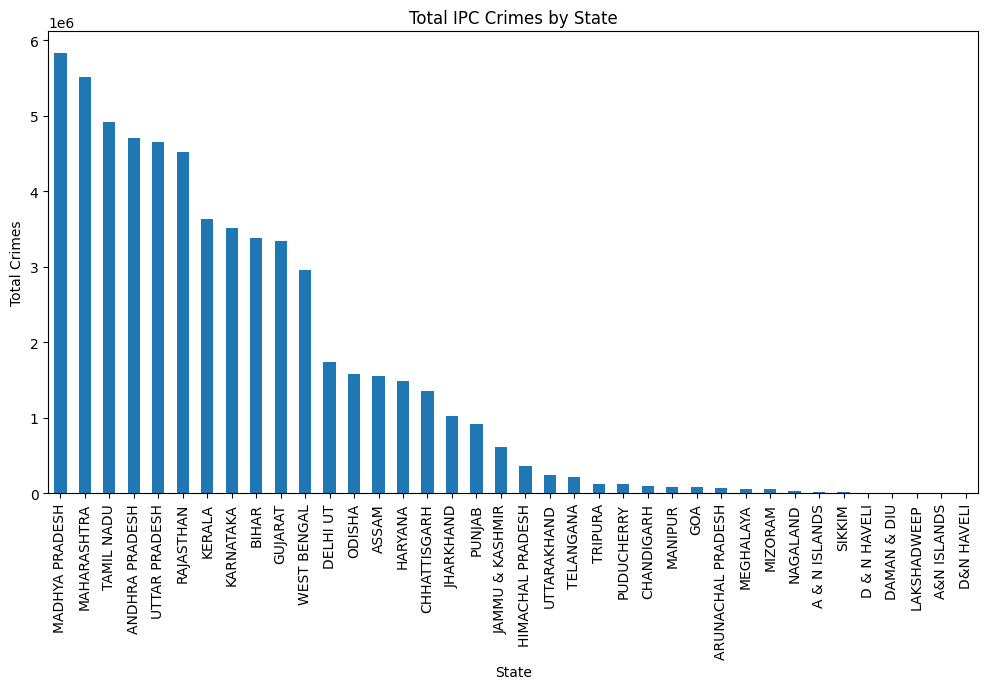

Top 5 Districts with Highest Total IPC Crimes:
DISTRICT
TOTAL               28814141
DELHI UT TOTAL        633174
BANGALORE COMMR.      380665
MUMBAI COMMR.         297871
INDORE                250639
Name: TOTAL IPC CRIMES, dtype: int64


In [10]:
state_crimes = df.groupby('STATE/UT')['TOTAL IPC CRIMES'].sum().sort_values(ascending=False)
state_crimes.plot(kind='bar', figsize=(12, 6))
plt.title("Total IPC Crimes by State")
plt.ylabel("Total Crimes")
plt.xlabel("State")
plt.xticks(rotation=90)
plt.show()

top_5_districts = df.groupby('DISTRICT')['TOTAL IPC CRIMES'].sum().sort_values(ascending=False).head(5)
print(f"Top 5 Districts with Highest Total IPC Crimes:\n{top_5_districts}")

In [11]:
df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

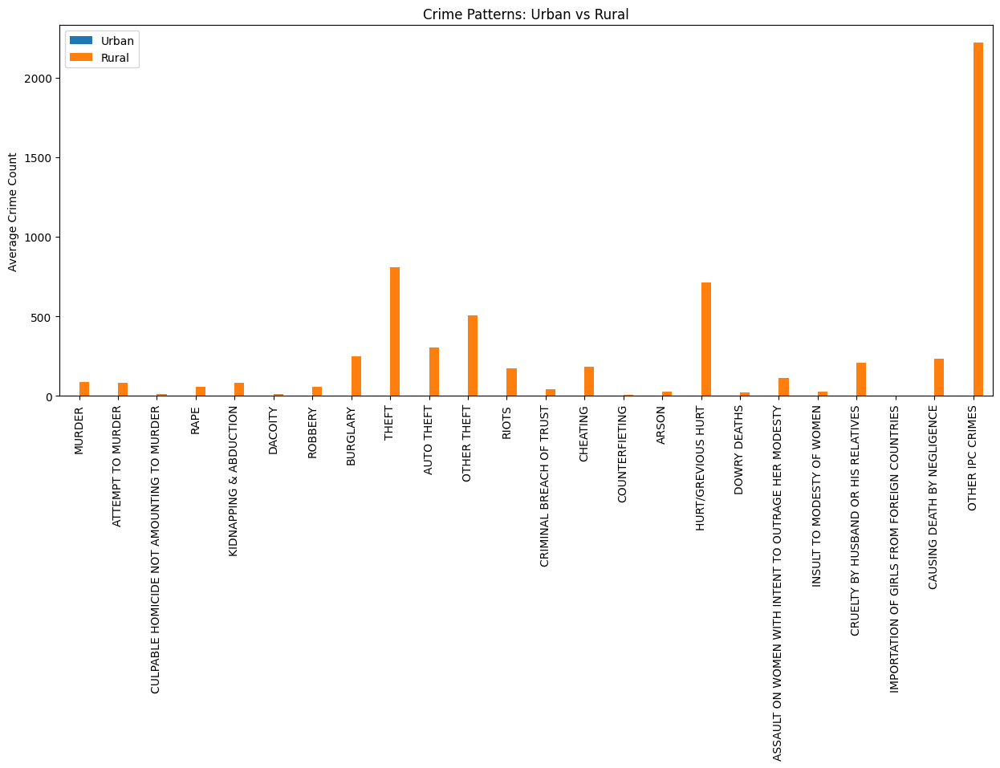

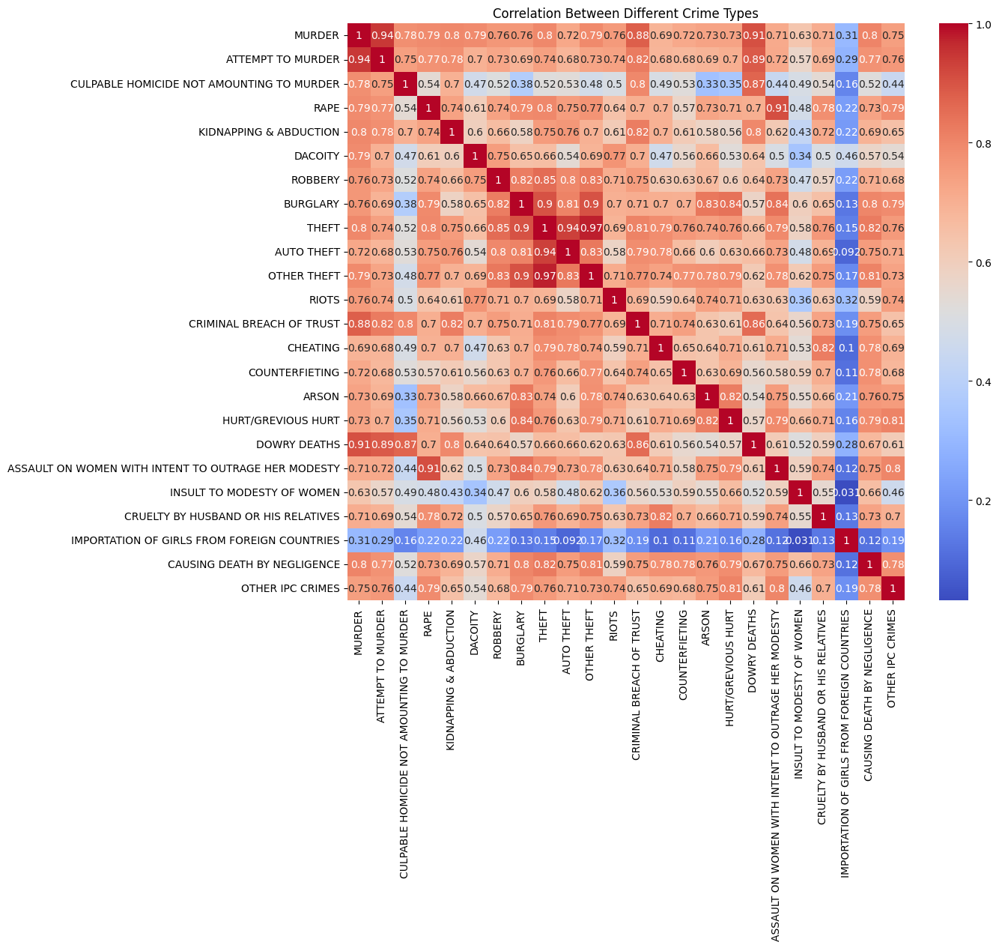

Correlation between Murder and Theft: 0.7984557140188948


In [12]:
urban_districts_list = [
    'Bangalore Urban', 'Delhi', 'Mumbai', 'Chennai', 'Kolkata', 'Hyderabad', 
    'Ahmedabad', 'Pune', 'Jaipur', 'Surat', 'Lucknow', 'Indore', 'Patna', 'Bhopal', 'Vadodara'
]

urban_districts = df[df['DISTRICT'].isin(urban_districts_list)]
rural_districts = df[~df['DISTRICT'].isin(urban_districts_list)]


crime_types = [
    'MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 
    'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 
    'THEFT', 'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST', 
    'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT', 'DOWRY DEATHS', 
    'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN',
    'CRUELTY BY HUSBAND OR HIS RELATIVES', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
    'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES'
]
urban_crimes = urban_districts[crime_types].mean()
rural_crimes = rural_districts[crime_types].mean()

crime_comparison = pd.DataFrame({'Urban': urban_crimes, 'Rural': rural_crimes})
crime_comparison.plot(kind='bar', figsize=(15, 6))
plt.title("Crime Patterns: Urban vs Rural")
plt.ylabel("Average Crime Count")
plt.xticks(rotation=90)
plt.show()

# 7. Correlation Between Crime Types
crime_corr = df[crime_types].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(crime_corr, annot=True, cmap='coolwarm')
plt.title("Correlation Between Different Crime Types")
plt.show()

murder_theft_corr = df[['MURDER', 'THEFT']].corr()
print("Correlation between Murder and Theft:", murder_theft_corr.iloc[0, 1])

The heatmap highlights that property crimes like theft, burglary, and robbery are strongly related, reflecting similar socio-economic dynamics.

Violent crimes like murder and attempted murder are highly correlated, indicating that districts with violent tendencies see a greater number of both fatal and non-fatal violent acts.

Gender-based violence (rape, dowry deaths, and assault on women) shows some degree of correlation but also distinct patterns.

Economic crimes like counterfeiting and cheating share a notable correlation, suggesting they are driven by similar motivations.



# Identifying the Top 10 Districts with the Highest Crime Rates:

### Bar Chart: A bar chart can effectively display the top 10 districts with the highest total IPC crimes. This allows you to quickly identify which districts have the most significant crime rates.

# Understanding the Overall Distribution of Total IPC Crimes

### Histogram: A histogram helps visualize the distribution of crime counts across districts. It can reveal how crime is distributed – for example, if most districts report low crime or if a few districts have disproportionately high crime.

# Analyzing Crime Density Across Different States:

### Bar Chart: A bar chart showing the total IPC crimes for each state can reveal regions with high crime density. This helps understand which states have the highest crime rates and can be used to identify regions in need of more focused law enforcement efforts.

# Comparing Trends in Violent Crimes such as Murder and Rape Across Various Districts:
### Line Plot: A line plot can be used to compare the trends in violent crimes (like murder and rape) over time across districts. This will help identify whether violent crimes are increasing or decreasing in specific districts or states.

<!-- # 8. Clustering Districts Based on Crime Patterns (K-Means)
X = df_cleaned[crime_types].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=4, random_state=42)
df_cleaned['Crime Cluster'] = kmeans.fit_predict(X_scaled)

# Plot clusters
sns.scatterplot(x='Murder', y='Theft', hue='Crime Cluster', data=df_cleaned, palette='Set1')
plt.title("Clustering Districts Based on Crime Patterns")
plt.show()

# 9. Predicting Future Crime Trends (Linear Regression for IPC Crimes)
df_cleaned['Year'] = df_cleaned['Year'].astype(int)
X = df_cleaned[['Year']]
y = df_cleaned['TOTAL IPC CRIMES']

regressor = LinearRegression()
regressor.fit(X, y)

# Predict crimes for the next 5 years
future_years = pd.DataFrame({'Year': [2015, 2016, 2017, 2018, 2019]})
predictions = regressor.predict(future_years)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(df_cleaned['Year'], df_cleaned['TOTAL IPC CRIMES'], label="Actual Data")
plt.plot(future_years['Year'], predictions, label="Predicted Data", linestyle='--')
plt.title("Crime Prediction: Linear Regression")
plt.xlabel("Year")
plt.ylabel("Total IPC Crimes")
plt.legend()
plt.show()

# 10. Crime Risk Index (Basic Formula)
df_cleaned['Crime Risk Index'] = df_cleaned['TOTAL IPC CRIMES'] / df_cleaned['Population']
df_cleaned['Crime Risk Index'].plot(kind='hist', bins=50, figsize=(12, 6), color='orange', alpha=0.7)
plt.title("Crime Risk Index Distribution")
plt.xlabel("Crime Risk Index")
plt.ylabel("Frequency")
plt.show() -->

In [13]:
## https://public.tableau.com/app/profile/neel.lakdawala/viz/Book1_17444987729340/Dashboard1?publish=yes (link for visualization)

# State with the lowest crime rate

In [14]:
state_crimes = df.groupby('STATE/UT')['TOTAL IPC CRIMES'].sum().sort_values()

lowest_crime_state = state_crimes.idxmin()
lowest_crime_value = state_crimes.min()

print(f"The state with the lowest crime rate is {lowest_crime_state} with {lowest_crime_value} crimes.")


The state with the lowest crime rate is D&N HAVELI with 554 crimes.


### The state with the lowest crime rate might be lower than others due to a variety of socio-economic, geographical, cultural, and law enforcement factors. Here are some possible reasons why certain states could have lower crime rates:Rural vs. Urban Composition, Economic Stability and Development, Law Enforcement and Judicial Efficiency, Geographical and Environmental Factors

# Most Common Crime in Each District

In [15]:
crime_types = [
    'MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 
    'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY', 'ROBBERY', 'BURGLARY', 
    'THEFT', 'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST', 
    'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT', 'DOWRY DEATHS', 
    'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN',
    'CRUELTY BY HUSBAND OR HIS RELATIVES', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
    'CAUSING DEATH BY NEGLIGENCE'
]
def most_common_crime(row):
    crime_counts = row[crime_types]
    return crime_counts.idxmax()

df['Most Common Crime'] = df.apply(most_common_crime, axis=1)

most_common_crimes_by_district = df.groupby('DISTRICT')['Most Common Crime'].first()

print(most_common_crimes_by_district)


DISTRICT
24 PARGANAS NORTH                 THEFT
24 PARGANAS SOUTH                 THEFT
A and N ISLANDS                   THEFT
ADILABAD             HURT/GREVIOUS HURT
AGAR                 HURT/GREVIOUS HURT
                            ...        
WOKHA                             THEFT
YADGIRI              HURT/GREVIOUS HURT
YAMUNANAGAR          HURT/GREVIOUS HURT
YAVATMAL             HURT/GREVIOUS HURT
ZUNHEBOTO                      BURGLARY
Name: Most Common Crime, Length: 954, dtype: object


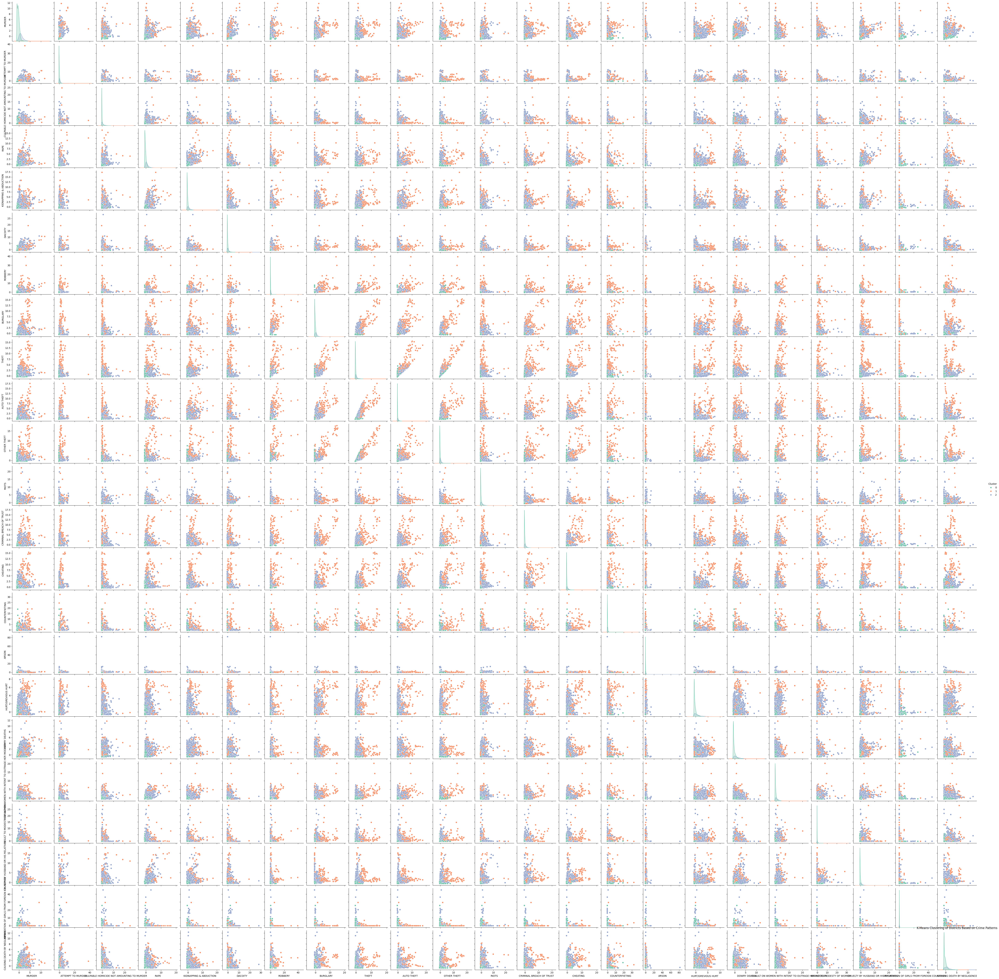

        DISTRICT  Cluster
0       ADILABAD        2
1      ANANTAPUR        2
2       CHITTOOR        2
3       CUDDAPAH        0
4  EAST GODAVARI        2


In [25]:
X = df_cleaned[crime_types]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42) 
df_cleaned.loc[:, 'Cluster'] = kmeans.fit_predict(X_scaled)

sns.pairplot(df_cleaned, hue='Cluster', vars=crime_types, palette='Set2')
plt.title('K-Means Clustering of Districts Based on Crime Patterns')
plt.show()

print(df_cleaned[['DISTRICT', 'Cluster']].head())

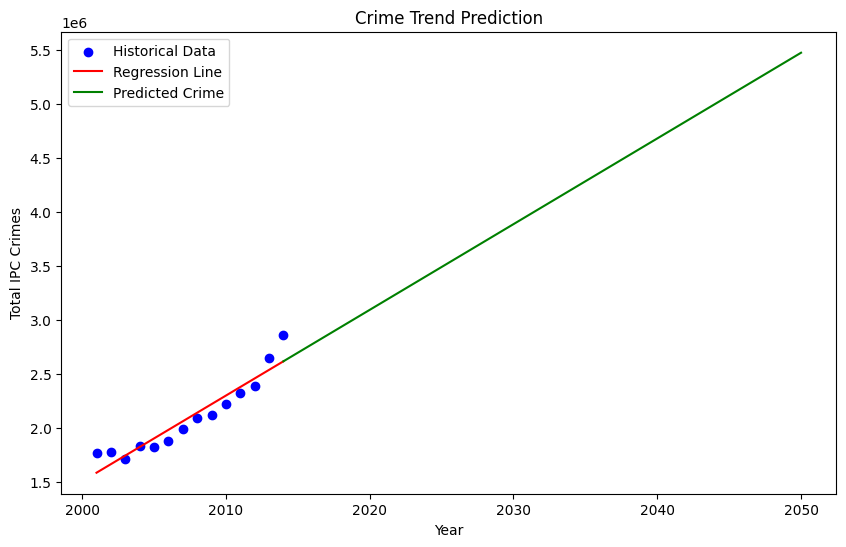

Predicted Crimes for Future Years: [2618309.48571429 2776749.43736264 2935189.38901097 3093629.34065932
 3252069.29230767 3410509.24395603 3568949.19560438 3727389.14725274
 3885829.09890109 4044269.05054945 4202709.0021978  4361148.95384616
 4519588.90549448 4678028.85714284 4836468.80879119 4994908.76043954
 5153348.7120879  5311788.66373625 5470228.61538461]


In [17]:
df_yearly = df_cleaned.groupby('YEAR')['TOTAL IPC CRIMES'].sum().reset_index()

X = df_yearly['YEAR'].values.reshape(-1, 1)
y = df_yearly['TOTAL IPC CRIMES'].values

model = LinearRegression()
model.fit(X, y)

future_years = np.arange(2014, 2051, 2).reshape(-1, 1)
predictions = model.predict(future_years)

plt.figure(figsize=(10, 6))
plt.scatter(df_yearly['YEAR'], df_yearly['TOTAL IPC CRIMES'], color='blue', label='Historical Data')
plt.plot(df_yearly['YEAR'], model.predict(X), color='red', label='Regression Line')
plt.plot(future_years, predictions, color='green', label='Predicted Crime')
plt.title('Crime Trend Prediction')
plt.xlabel('Year')
plt.ylabel('Total IPC Crimes')
plt.legend()
plt.show()

print(f"Predicted Crimes for Future Years: {predictions}")

In [18]:
threshold = df['TOTAL IPC CRIMES'].median()
df['Crime Class'] = (df['TOTAL IPC CRIMES'] > threshold).astype(int)

X_class = df[crime_types]
y_class = df['Crime Class']

X_train, X_test, y_train, y_test = train_test_split(X_class, y_class, test_size=0.3, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1573
           1       0.94      0.96      0.95      1631

    accuracy                           0.95      3204
   macro avg       0.95      0.95      0.95      3204
weighted avg       0.95      0.95      0.95      3204



# What percentage of crimes are committed against women?

/var/folders/1l/d1qg7ms53zsf805d46fz7y7h0000gn/T/ipykernel_74196/3737652841.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['Crime Risk Index'] = df_cleaned[crime_types].sum(axis=1)


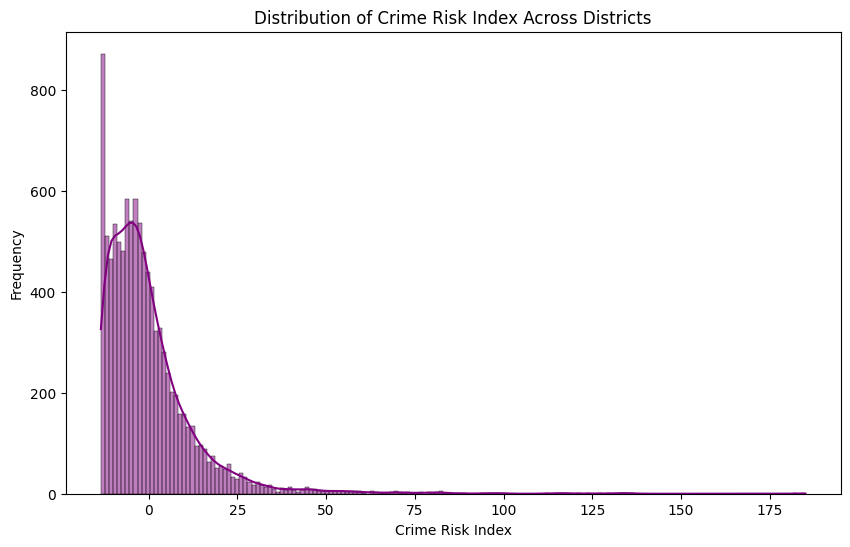

             DISTRICT  Crime Risk Index
9445    MUMBAI COMMR.        185.043539
10264   MUMBAI COMMR.        182.380801
8630    MUMBAI COMMR.        136.028591
7829    MUMBAI COMMR.        135.374787
7044    MUMBAI COMMR.        133.983757
3278           MUMBAI        133.433714
5504    MUMBAI COMMR.        133.092646
10132  BENGALURU CITY        132.776706
6269    MUMBAI COMMR.        129.113499
4012    MUMBAI COMMR.        126.963027


In [28]:
df_cleaned.loc[:, crime_types] = scaler.fit_transform(df_cleaned[crime_types])

df_cleaned['Crime Risk Index'] = df_cleaned[crime_types].sum(axis=1)

plt.figure(figsize=(10, 6))
sns.histplot(df_cleaned['Crime Risk Index'], kde=True, color='purple')
plt.title('Distribution of Crime Risk Index Across Districts')
plt.xlabel('Crime Risk Index')
plt.ylabel('Frequency')
plt.show()

print(df_cleaned[['DISTRICT', 'Crime Risk Index']].sort_values(by='Crime Risk Index', ascending=False).head(10))


# Identify the state with the highest number of dowry deaths.

In [20]:
crimes_against_women = [
    'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 
    'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
    'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
    'DOWRY DEATHS', 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS'
]

total_crimes_against_women = df_cleaned[crimes_against_women].sum().sum()

total_crimes = df_cleaned['TOTAL IPC CRIMES'].sum()

percentage_women_crimes = (total_crimes_against_women / total_crimes) * 100
print(f"Percentage of crimes committed against women: {percentage_women_crimes:.2f}%")


Percentage of crimes committed against women: 2.19%


In [21]:
state_dowry_deaths = df_cleaned.groupby('STATE/UT')['DOWRY DEATHS'].sum().sort_values(ascending=False)

highest_dowry_deaths_state = state_dowry_deaths.idxmax()
highest_dowry_deaths_value = state_dowry_deaths.max()

print(f"State with the highest number of dowry deaths: {highest_dowry_deaths_state} with {int(highest_dowry_deaths_value)} deaths.")


State with the highest number of dowry deaths: UTTAR PRADESH with 1248 deaths.


# Build a time-series model to forecast crime rates for the next five years.

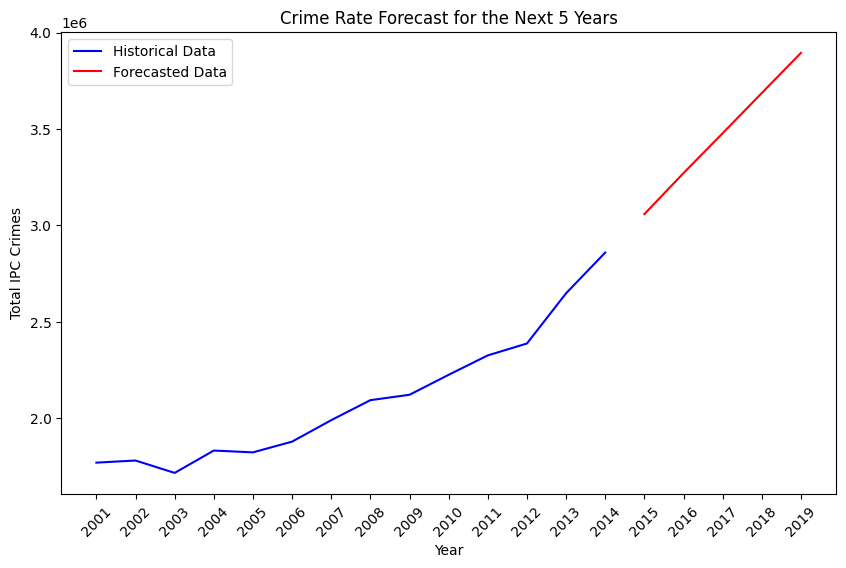

In [24]:
# Use only the 'TOTAL IPC CRIMES' column for the ARIMA model
model = ARIMA(df_yearly['TOTAL IPC CRIMES'], order=(1, 2, 3))  
model_fit = model.fit()

forecast_steps = 5
forecast = model_fit.forecast(steps=forecast_steps)

# Generate forecast years
forecast_years = np.arange(df_yearly['YEAR'].iloc[-1] + 1, df_yearly['YEAR'].iloc[-1] + forecast_steps + 1)

plt.figure(figsize=(10, 6))
plt.plot(df_yearly['YEAR'], df_yearly['TOTAL IPC CRIMES'], label='Historical Data', color='blue')
plt.plot(forecast_years, forecast, label='Forecasted Data', color='red')

plt.title('Crime Rate Forecast for the Next 5 Years')
plt.xlabel('Year')
plt.ylabel('Total IPC Crimes')
plt.xticks(np.concatenate((df_yearly['YEAR'], forecast_years)), rotation=45)
plt.legend()

plt.show()
